In [1]:
pip install opencv-python


Note: you may need to restart the kernel to use updated packages.


In [2]:
import tensorflow as tf
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import Dense,Flatten,Conv2D,MaxPooling2D
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers  import Concatenate
from tensorflow.keras.layers import AveragePooling2D, Dropout, Input, BatchNormalization
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.optimizers import SGD
from keras.preprocessing import image
from sklearn.metrics import precision_recall_curve
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import f1_score
import urllib.request
from sklearn.preprocessing import label_binarize
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score
from keras.layers import Input, Add, Dense,GlobalAvgPool2D, Concatenate, AvgPool2D, Dropout, ReLU, Activation, MaxPool2D, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, GlobalAveragePooling2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D
import matplotlib.pyplot as plt
import os
import pandas as pd
import seaborn as sns
import numpy as np
import cv2
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from tensorflow.keras.optimizers import RMSprop, Adam

# Read Data

In [3]:
image_path="E:\\anaconda\\anaconda 3\\envs\\PlantLeafDiseaseDetection\\train"

In [4]:
train_path="E:\\anaconda\\anaconda 3\\envs\\PlantLeafDiseaseDetection\\train"
valid_path="E:\\anaconda\\anaconda 3\\envs\\PlantLeafDiseaseDetection\\valid"
test_path="E:\\anaconda\\anaconda 3\\envs\\PlantLeafDiseaseDetection\\test"

# Visualize Images

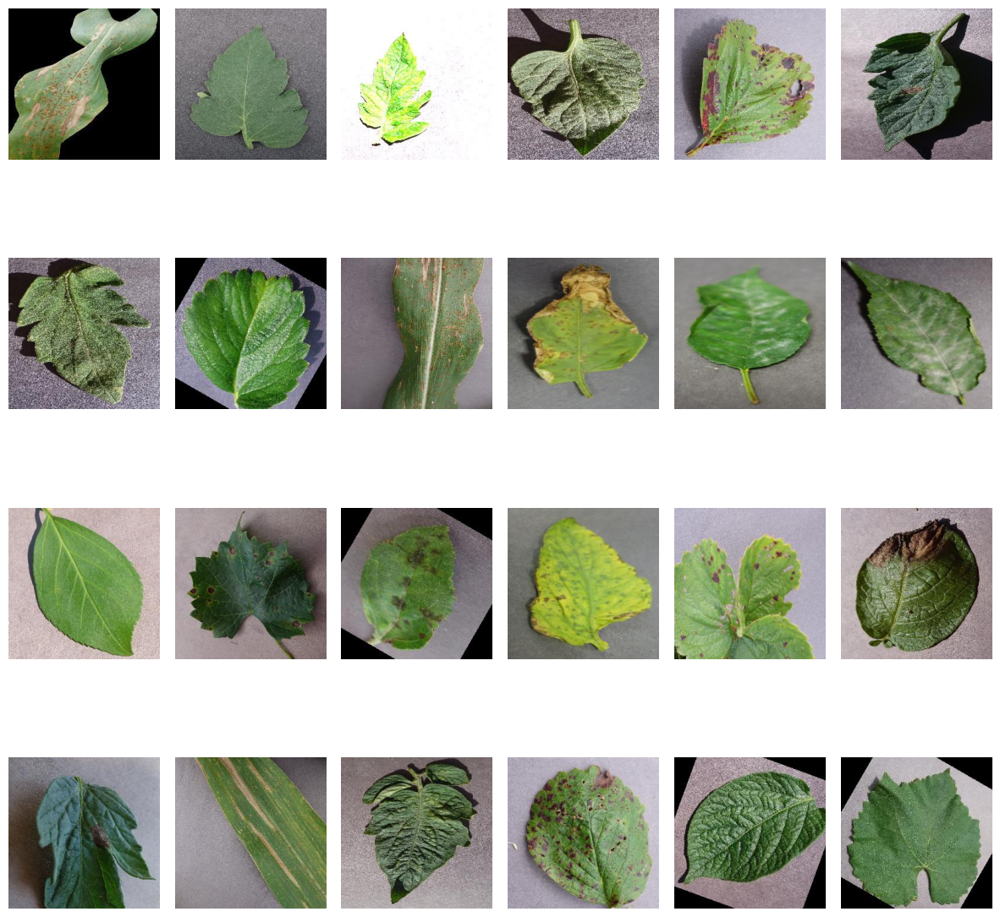

In [5]:
plt.figure(figsize=(15,15))
plt.subplots_adjust(wspace=0.1, hspace=0.1)

for i in range(24):
    random_folder=np.random.randint(0,len(os.listdir(image_path)))
    random_folder_path=os.path.join(image_path,os.listdir(image_path)[random_folder])
    random_image=np.random.randint(0,len(os.listdir(random_folder_path)))
    random_image_path=os.path.join(random_folder_path,os.listdir(random_folder_path)[random_image])
    image=cv2.imread(random_image_path)
    image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    plt.subplot(4,6,i+1)
    plt.imshow(image)
    plt.axis("off")
plt.show()

number_class

In [6]:
class_names = os.listdir(image_path)
print(class_names)

['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___healthy', 'Potato___Late_blight', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___healthy', 'Strawberry___Leaf_scorch', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___healthy', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite',

In [7]:
print("Number of classes : {}".format(len(class_names)))

Number of classes : 38


Number of images in each class

In [8]:
number_of_images = {}
for class_name in class_names:
    number_of_images[class_name] = len(os.listdir(image_path+"/"+class_name))
    
images_each_class = pd.DataFrame(list(number_of_images.items()), columns=['Class Name', 'Number of Images'])


In [9]:
images_each_class

,Class Name,Number of Images
0,Apple___Apple_scab,2016
1,Apple___Black_rot,1987
2,Apple___Cedar_apple_rust,1760
3,Apple___healthy,2008
4,Blueberry___healthy,1816
5,Cherry_(including_sour)___healthy,1826
6,Cherry_(including_sour)___Powdery_mildew,1683
7,Corn_(maize)___Cercospora_leaf_spot Gray_leaf_...,1642
8,Corn_(maize)___Common_rust_,1907
9,Corn_(maize)___healthy,1859


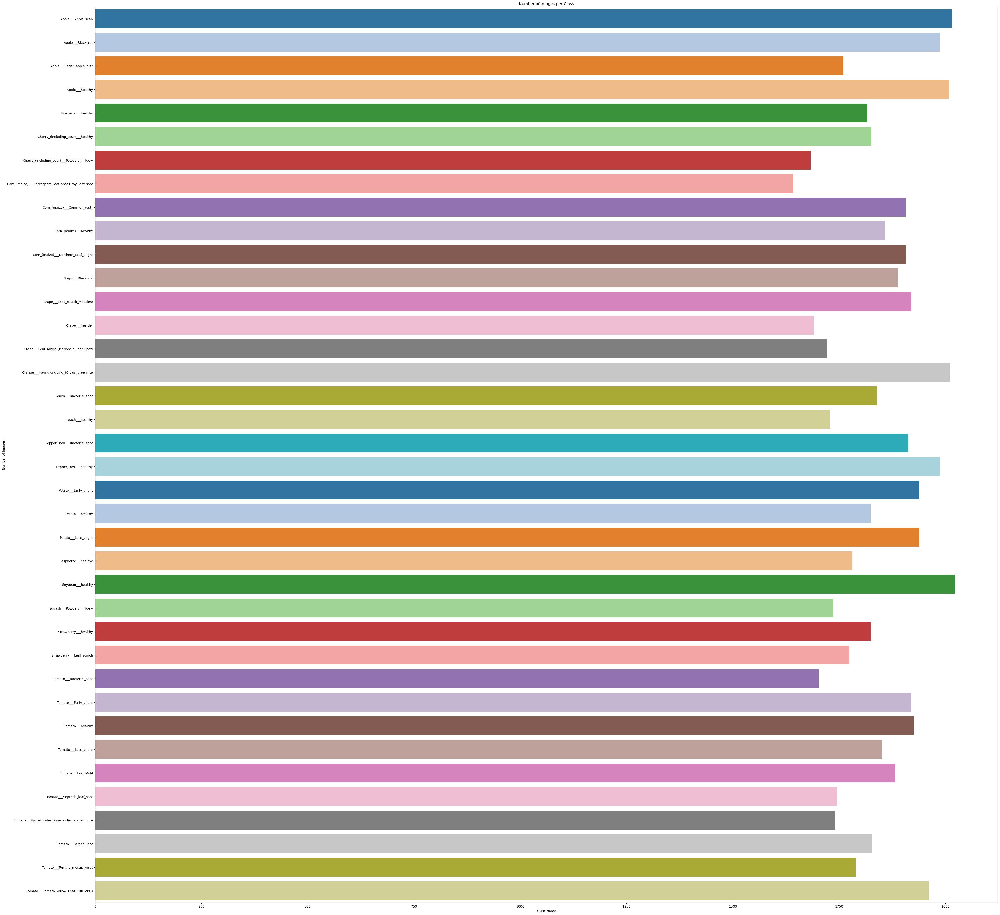

In [10]:
plt.figure(figsize=(50,50))
sns.barplot(y='Class Name', x='Number of Images', data=images_each_class,palette="tab20")
plt.title('Number of Images per Class')
plt.xlabel('Class Name')
plt.ylabel('Number of Images')
plt.show()

In [11]:
batch_size=20

train_data,valid_data and test_data Generator

In [12]:
traindata_generator=tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255,zoom_range=0.2,width_shift_range=0.2,height_shift_range=0.2,
                                                                    shear_range=0.2, horizontal_flip=True,validation_split=0.2,fill_mode='nearest')

validdata_generator=tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
testdata_generator=tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

In [13]:
train_data_generator=traindata_generator.flow_from_directory(train_path,batch_size=batch_size,class_mode="categorical",
                                                           target_size=(224,224),color_mode="rgb",shuffle=True )

Found 70295 images belonging to 38 classes.


In [14]:
valid_data_generator=validdata_generator.flow_from_directory(train_path,batch_size=batch_size,class_mode="categorical",
                                                           target_size=(224,224),color_mode="rgb",shuffle=True)

Found 70295 images belonging to 38 classes.


In [15]:
test_data_generator=testdata_generator.flow_from_directory(valid_path,batch_size=batch_size,class_mode="categorical",
                                                           target_size=(224,224),color_mode="rgb",shuffle=False )

Found 17572 images belonging to 38 classes.


In [16]:
class_dict = train_data_generator.class_indices
class_list = list(class_dict.keys())
class_list

['Apple___Apple_scab',
 'Apple___Black_rot',
 'Apple___Cedar_apple_rust',
 'Apple___healthy',
 'Blueberry___healthy',
 'Cherry_(including_sour)___Powdery_mildew',
 'Cherry_(including_sour)___healthy',
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot',
 'Corn_(maize)___Common_rust_',
 'Corn_(maize)___Northern_Leaf_Blight',
 'Corn_(maize)___healthy',
 'Grape___Black_rot',
 'Grape___Esca_(Black_Measles)',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Grape___healthy',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Peach___Bacterial_spot',
 'Peach___healthy',
 'Pepper,_bell___Bacterial_spot',
 'Pepper,_bell___healthy',
 'Potato___Early_blight',
 'Potato___Late_blight',
 'Potato___healthy',
 'Raspberry___healthy',
 'Soybean___healthy',
 'Squash___Powdery_mildew',
 'Strawberry___Leaf_scorch',
 'Strawberry___healthy',
 'Tomato___Bacterial_spot',
 'Tomato___Early_blight',
 'Tomato___Late_blight',
 'Tomato___Leaf_Mold',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Spider_mites Two-spotted_

In [17]:
train_number=train_data_generator.samples
valid_number=valid_data_generator.samples

# Create MobileNetV2 Model

In [18]:
mobilenetV2_model= tf.keras.applications.MobileNetV2(weights='imagenet',classes=38,include_top=False, input_shape=(224,224, 3))
x= mobilenetV2_model.output
x= GlobalAveragePooling2D()(x)
x= Dense(1024,activation='relu')(x) 
x= Dense(512,activation='relu')(x) 
x= BatchNormalization()(x)
x= Dropout(0.2)(x)
prediction= Dense(38, activation = 'softmax')(x)
model= Model(inputs= mobilenetV2_model.input, outputs= prediction)

model.compile(optimizer='Adam',loss='categorical_crossentropy',metrics=['accuracy'])
model.summary() 

model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 112, 112, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 112, 112, 32  128         ['Conv1[0][0]']                  
                                )                                                             

In [19]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='max', verbose=1, patience=50,baseline=0.4,min_delta=0.0001,restore_best_weights=False)

In [20]:
history= model.fit(train_data_generator, 
                   steps_per_epoch=train_number//batch_size, 
                   validation_data= valid_data_generator, 
                   validation_steps= valid_number//batch_size,
                   shuffle=True, 
                   
                   epochs = 5, 
                   batch_size = 20,callbacks=[callback])

Epoch 1/5
3514/3514 [==============================] - 5176s 1s/step - loss: 0.4394 - accuracy: 0.8676 - val_loss: 11.7986 - val_accuracy: 0.1061
Epoch 2/5
3514/3514 [==============================] - 4490s 1s/step - loss: 0.2268 - accuracy: 0.9284 - val_loss: 2.1542 - val_accuracy: 0.6835
Epoch 3/5
3514/3514 [==============================] - 5578s 2s/step - loss: 0.1663 - accuracy: 0.9473 - val_loss: 0.9436 - val_accuracy: 0.7890
Epoch 4/5
3514/3514 [==============================] - 4700s 1s/step - loss: 0.1327 - accuracy: 0.9584 - val_loss: 0.8835 - val_accuracy: 0.8108
Epoch 5/5
3514/3514 [==============================] - 4978s 1s/step - loss: 0.1133 - accuracy: 0.9641 - val_loss: 0.8563 - val_accuracy: 0.7899


# Summarize History For Accuracy

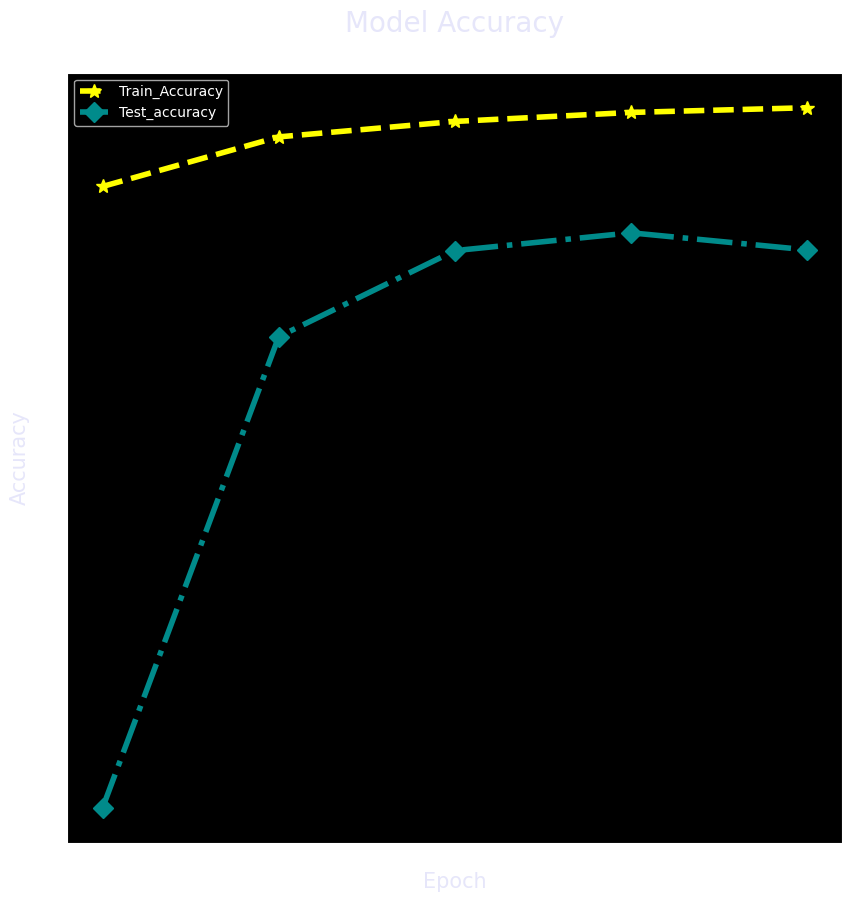

In [21]:
# summarize history for accuracy
plt.figure(figsize=(10,10))
plt.style.use("dark_background")
plt.plot(history.history['accuracy'],marker="*",linestyle="--",color="yellow",markersize=10,lw=4)
plt.plot(history.history['val_accuracy'],marker="D",linestyle="-.",color="darkcyan",markersize=10,lw=4)
plt.title('Model Accuracy\n',color="lavender",fontsize=20)
plt.ylabel('Accuracy',color="lavender",fontsize=15)
plt.xlabel('Epoch',color="lavender",fontsize=15)
plt.legend(['Train_Accuracy', 'Test_accuracy'], loc='upper left')
plt.show()


# Summarize History For Loss

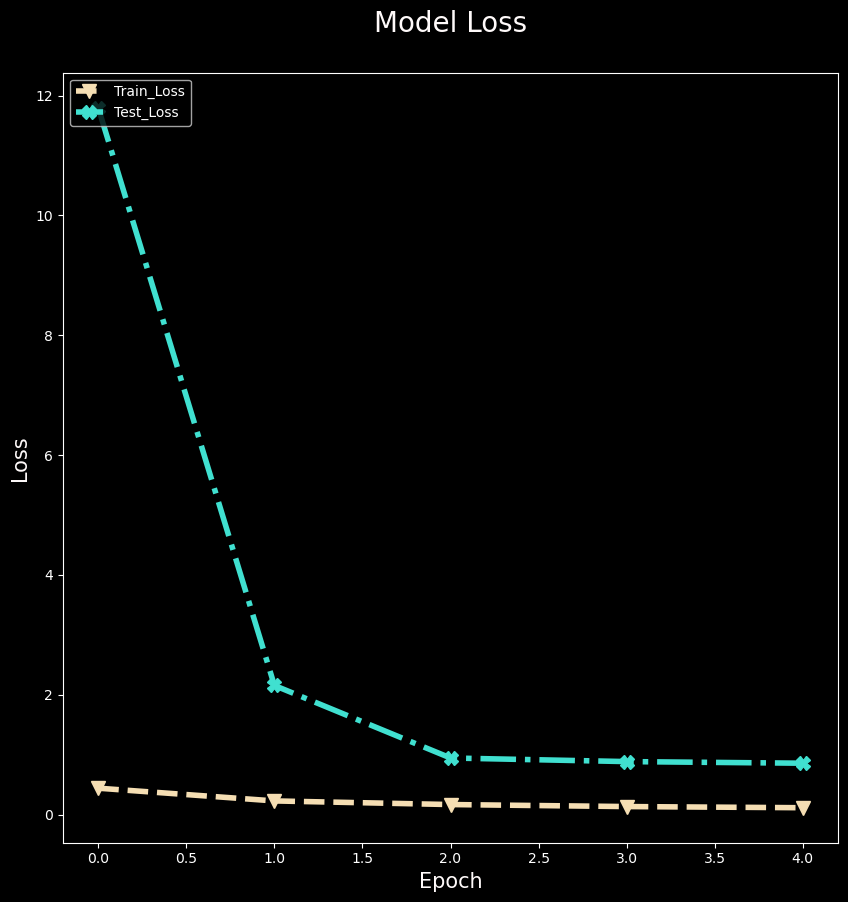

In [22]:
# summarize history for loss
plt.figure(figsize=(10,10))
plt.style.use("dark_background")
plt.plot(history.history['loss'],marker="v",linestyle="--",color="wheat",markersize=10,lw=4)
plt.plot(history.history['val_loss'],marker="X",linestyle="-.",color="turquoise",markersize=10,lw=4)
plt.title('Model Loss\n',color="snow",fontsize=20)
plt.ylabel('Loss',color="snow",fontsize=15)
plt.xlabel('Epoch',color="snow",fontsize=15)
plt.legend(['Train_Loss', 'Test_Loss'], loc='upper left')
plt.show()


# Save And Load Model

In [23]:
# Assuming your model object is called 'model'
model.save('my_model.h6')
model = load_model('my_model.h6')


INFO:tensorflow:Assets written to: my_model.h6\assets


INFO:tensorflow:Assets written to: my_model.h6\assets


In [24]:
pred=model.predict(test_data_generator,steps=valid_number//batch_size)
final_predict=np.argmax(pred,axis=1)
true_data=test_data_generator.classes

 879/3514 [======>.......................] - ETA: 11:50WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 3514 batches). You may need to use the repeat() function when building your dataset.


3514/3514 [==============================] - 243s 68ms/step


# Accuracy Score

In [25]:
print("Accuracy Score is",accuracy_score(true_data,final_predict))

Accuracy Score is 0.7848850443888004


# ROC AUC Score

In [26]:
print("ROC AUC Score is {}".format(roc_auc_score(true_data, pred,multi_class='ovr')))

ROC AUC Score is 0.9965217125541521


# Average Precision Score

In [27]:

# true_data: true labels
# pred: predicted labels

# convert true labels to binary format
num_classes = len(set(true_data))
true_data_bin = label_binarize(true_data, classes=range(num_classes))

# calculate average precision score for each class
avg_precisions = []
for class_idx in range(num_classes):
    y_true = true_data_bin[:, class_idx]
    y_pred = pred[:, class_idx]
    precision, recall, _ = precision_recall_curve(y_true, y_pred)
    avg_precisions.append(average_precision_score(y_true, y_pred))
    
# calculate the final score as the average of all class scores
macro_avg_precision = sum(avg_precisions) / num_classes

macro_avg_precision 

0.9353140489616124

# Compute The F1 Score For Each Threshold Value

879/879 [==============================] - 233s 265ms/step


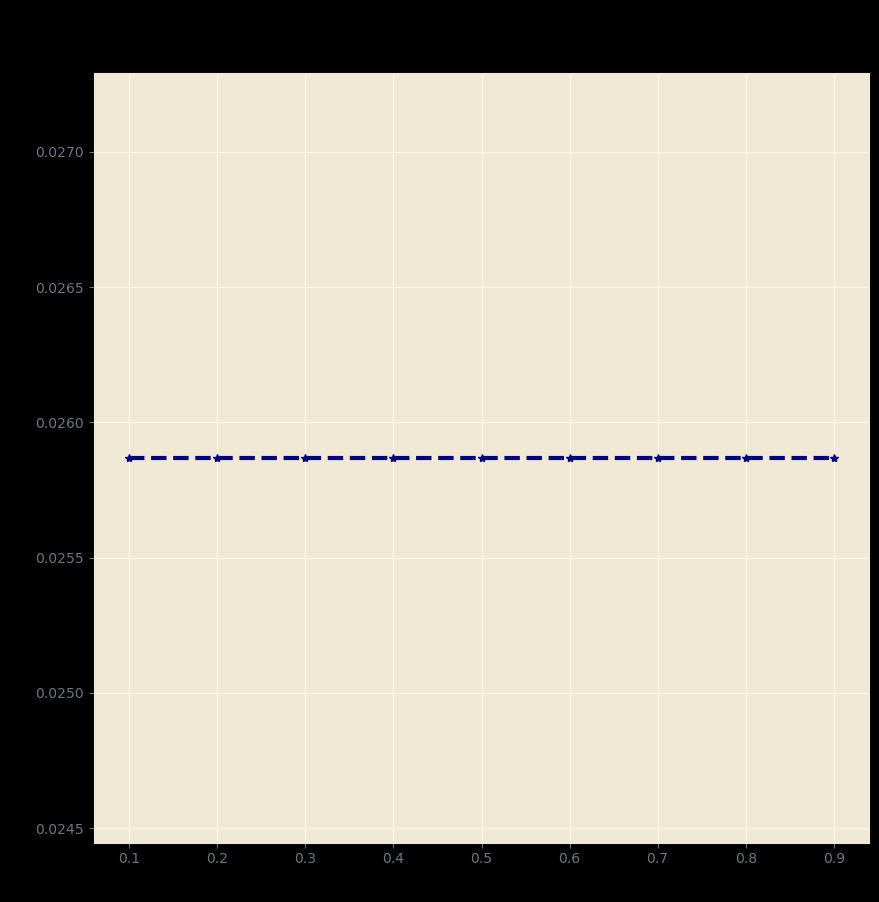

In [28]:

plt.figure(figsize=(10,10))
plt.style.use('Solarize_Light2')
# Compute the F1 score for each threshold value
y_pred = model.predict(test_data_generator)
y_pred = np.argmax(y_pred, axis=1)
y_true=test_data_generator.classes
f1_scores = []
thresholds = np.arange(0.1, 1.0, 0.1)
for threshold in thresholds:
    y_pred_threshold = (y_pred >= threshold).astype(int)
    f1_scores.append(f1_score(y_true, y_pred_threshold, average='macro'))

# Plot the F1 score curve
plt.plot(thresholds, f1_scores,color="navy",marker="*",linestyle="--",linewidth=3)
plt.xlabel('Threshold',color="black",fontsize=15)
plt.ylabel('F1 Score',color="black",fontsize=15)
plt.title('F1 Score Curve\n',fontsize=20,color="black")
plt.show()


#  Plot Precision-Recall curve

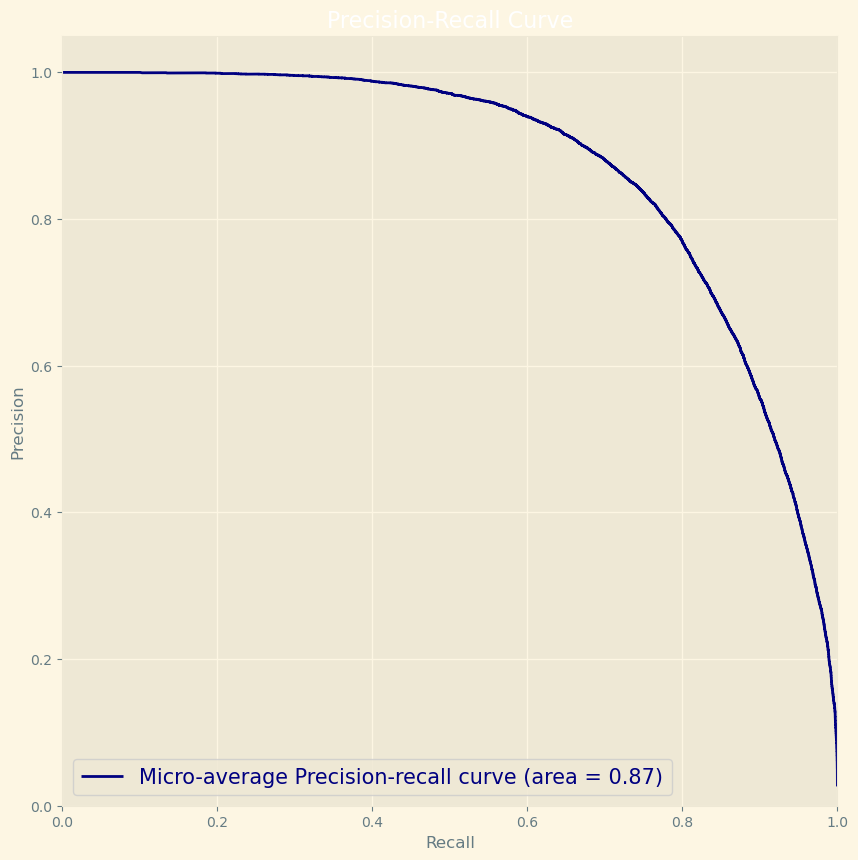

In [29]:
binarize_label = label_binarize(true_data, classes=range(num_classes))
my_class = binarize_label.shape[1]
# Compute Precision-Recall and plot curve
precision = dict()
recall = dict()
average_precision = dict()

for i in range(my_class):
    precision[i],recall[i], _ = precision_recall_curve(binarize_label[:,i],pred[:,i])
    average_precision[i]=average_precision_score(binarize_label[:,i],pred[:,i])
    
precision["micro"],recall["micro"], _ =precision_recall_curve(binarize_label.ravel(),pred.ravel())
average_precision["micro"]=average_precision_score(binarize_label,pred,average="micro")
                                                                  
# Plot Precision-Recall curve
plt.figure(figsize=(10,10))
plt.plot(recall["micro"], precision["micro"], label='Micro-average Precision-recall curve (area = {0:0.2f})'.format(average_precision["micro"]), linewidth=2, color='navy')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.title('Precision-Recall Curve')
plt.legend(loc="lower left",fontsize=15,labelcolor="navy")
plt.show()


#  Plot Precision-Recall curve for each class

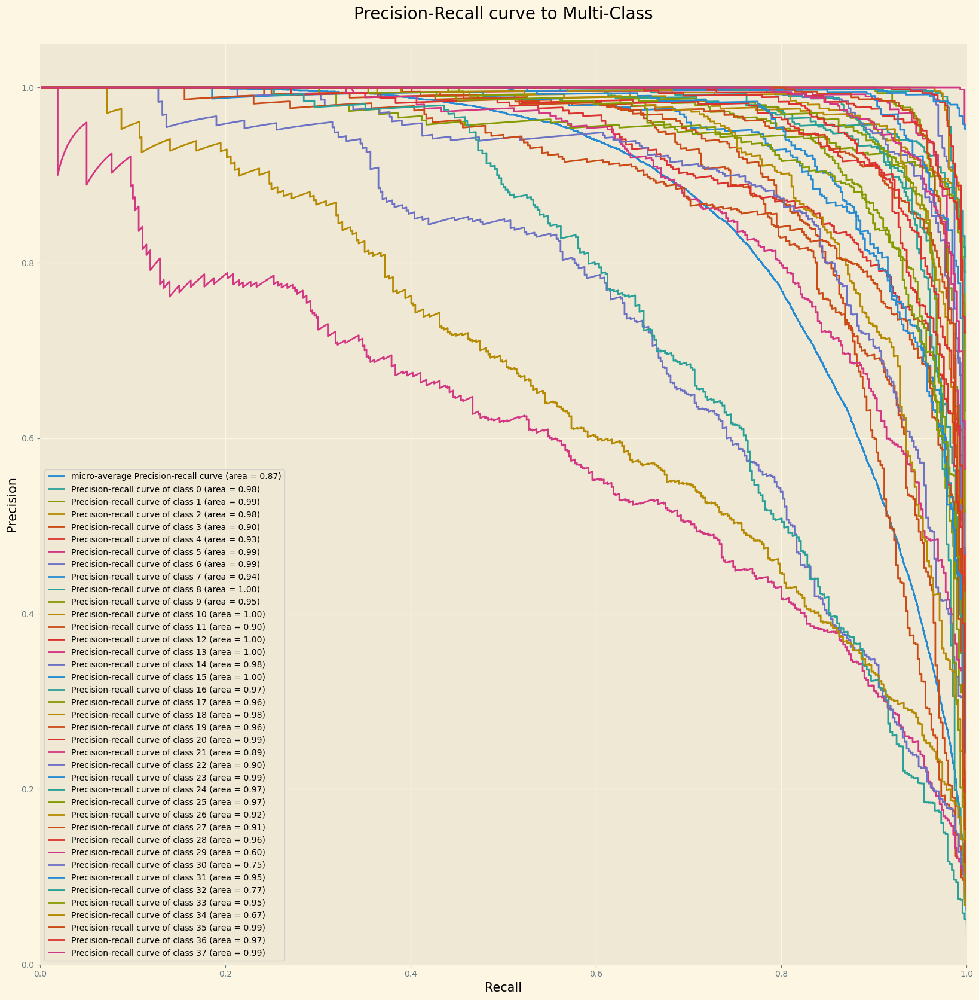

In [30]:
plt.figure(figsize=(20,20))
plt.plot(recall["micro"], precision["micro"],label='micro-average Precision-recall curve (area = {0:0.2f})' ''.format(average_precision["micro"]))
for i in range(my_class):
    plt.plot(recall[i], precision[i],label='Precision-recall curve of class {0} (area = {1:0.2f})' ''.format(i, average_precision[i]))

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Recall',fontsize=15,color="black")
plt.ylabel('Precision',fontsize=15,color="black")
plt.title('Precision-Recall curve to Multi-Class\n',fontsize=20,color="black")
plt.legend(loc="best",labelcolor="black")
plt.show()

#  Receiver Operating Characteristic (Micro-Averaged)

In [36]:
!pip install --upgrade seaborn

   ---------------------------------------- 0.0/294.9 kB ? eta -:--:--
   ---- ----------------------------------- 30.7/294.9 kB 1.3 MB/s eta 0:00:01
   ------------ -------------------------- 92.2/294.9 kB 871.5 kB/s eta 0:00:01
   --------------- ---------------------- 122.9/294.9 kB 901.1 kB/s eta 0:00:01
   ------------------ ------------------- 143.4/294.9 kB 944.1 kB/s eta 0:00:01
   ---------------------- --------------- 174.1/294.9 kB 803.1 kB/s eta 0:00:01
   -------------------------- ----------- 204.8/294.9 kB 731.4 kB/s eta 0:00:01
   ------------------------------- ------ 245.8/294.9 kB 752.5 kB/s eta 0:00:01
   ------------------------------------ - 286.7/294.9 kB 768.0 kB/s eta 0:00:01
   -------------------------------------- 294.9/294.9 kB 759.1 kB/s eta 0:00:00
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.12.2
    Uninstalling seaborn-0.12.2:
      Successfully uninstalled seaborn-0.12.2


In [42]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


879/879 [==============================] - 237s 269ms/step


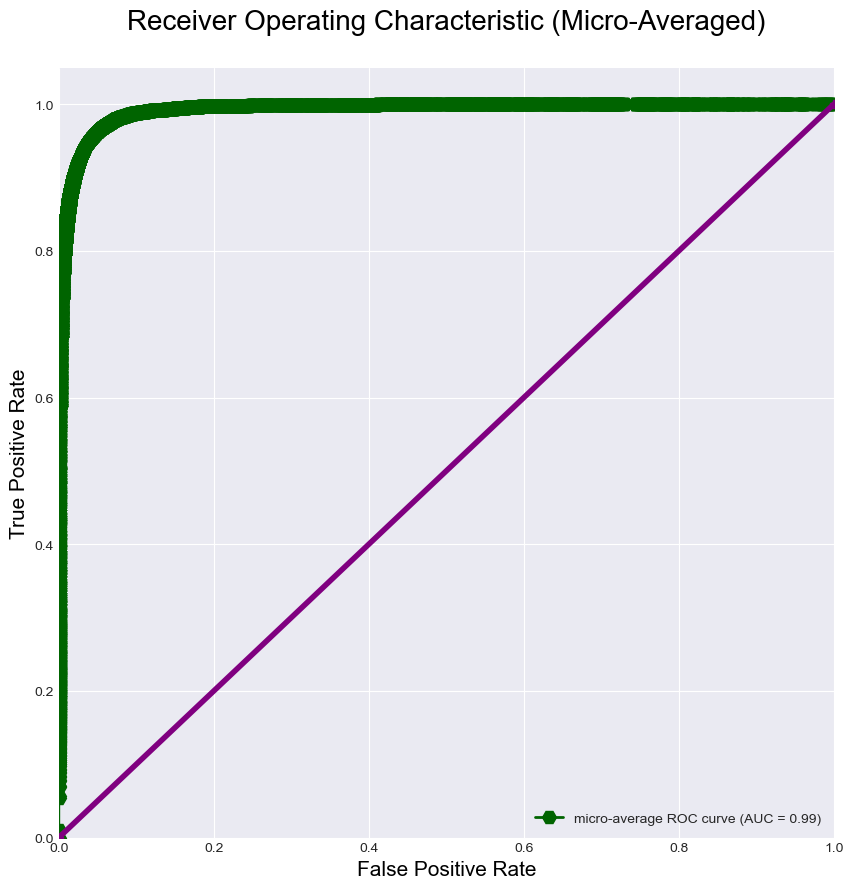

In [43]:
# Evaluate the model on the test data
test_steps = valid_number // batch_size
y_pred = model.predict(test_data_generator,test_steps)

# Compute the one-hot encoded class labels
y_true_onehot = tf.keras.utils.to_categorical(y_true)

# Compute the micro-averaged ROC curve and AUC score
fpr_micro, tpr_micro, thresholds_micro = roc_curve(y_true_onehot.ravel(), y_pred.ravel())
roc_auc_micro = auc(fpr_micro, tpr_micro)


# Plot the micro-averaged ROC curve
plt.figure(figsize=(10,10))
plt.style.use("seaborn-v0_8-darkgrid")
plt.plot(fpr_micro, tpr_micro, color='darkgreen', lw=2,marker="H",markersize=10, label='micro-average ROC curve (AUC = %0.2f)' % roc_auc_micro)
plt.plot([0, 1], [0, 1], color='purple', lw=4,marker="P")
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate',color="black",fontsize=15)
plt.ylabel('True Positive Rate',color="black",fontsize=15)
plt.title('Receiver Operating Characteristic (Micro-Averaged)\n',color="black",fontsize=20)
plt.legend(loc="lower right")
plt.show()


# Receiver Operating Characteristic (Macro-Averaged)

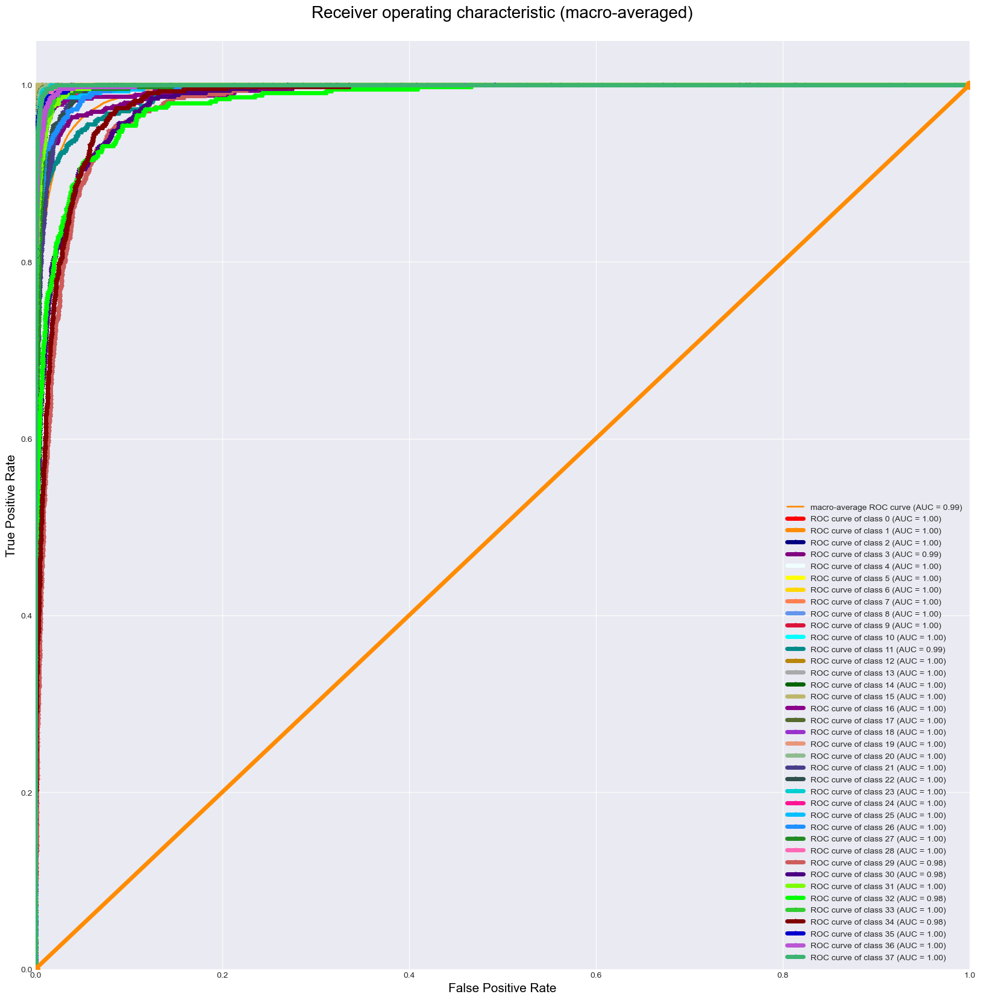

In [44]:
# Compute the macro-averaged ROC curve and AUC score
num_classes=38
colors = ["red", "darkorange", "navy", "purple", "azure", "yellow", "gold", "coral", "cornflowerblue",           "crimson", "cyan", "darkcyan", "darkgoldenrod", "darkgray", "darkgreen", "darkkhaki",           "darkmagenta", "darkolivegreen", "darkorchid", "darksalmon", "darkseagreen", "darkslateblue",           "darkslategray", "darkturquoise", "deeppink", "deepskyblue", "dodgerblue", "forestgreen",           "hotpink", "indianred", "indigo", "lawngreen", "lime", "limegreen", "maroon", "mediumblue",           "mediumorchid", "mediumseagreen"]

fpr_macro = dict()
tpr_macro = dict()
roc_auc_macro = dict()
for i in range(num_classes):
    fpr_macro[i], tpr_macro[i], _ = roc_curve(y_true_onehot[:, i], y_pred[:, i])
    roc_auc_macro[i] = auc(fpr_macro[i], tpr_macro[i])

# Compute the macro-average of the ROC curve and AUC score
fpr_macro["avg"], tpr_macro["avg"], _ = roc_curve(y_true_onehot.ravel(), y_pred.ravel())
roc_auc_macro["avg"] = auc(fpr_macro["avg"], tpr_macro["avg"])


# Plot the macro-averaged ROC curve
plt.figure(figsize=(20,20))
plt.style.use("seaborn-v0_8-dark-palette")
plt.plot(fpr_macro["avg"], tpr_macro["avg"], color='darkorange', lw=2, label='macro-average ROC curve (AUC = %0.2f)' % roc_auc_macro["avg"])
for i in range(num_classes):
    plt.plot(fpr_macro[i], tpr_macro[i], label='ROC curve of class %d (AUC = %0.2f)' % (i, roc_auc_macro[i]),color=colors[i],lw=5,marker="*")
    
plt.plot([0, 1], [0, 1], color='darkorange',marker="o",lw=5,markersize=10)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate',color="black",fontsize=15)
plt.ylabel('True Positive Rate',color="black",fontsize=15)
plt.title('Receiver operating characteristic (macro-averaged)\n',color="black",fontsize=20)
plt.legend(loc="best")
plt.show()

# Confusion Matrix

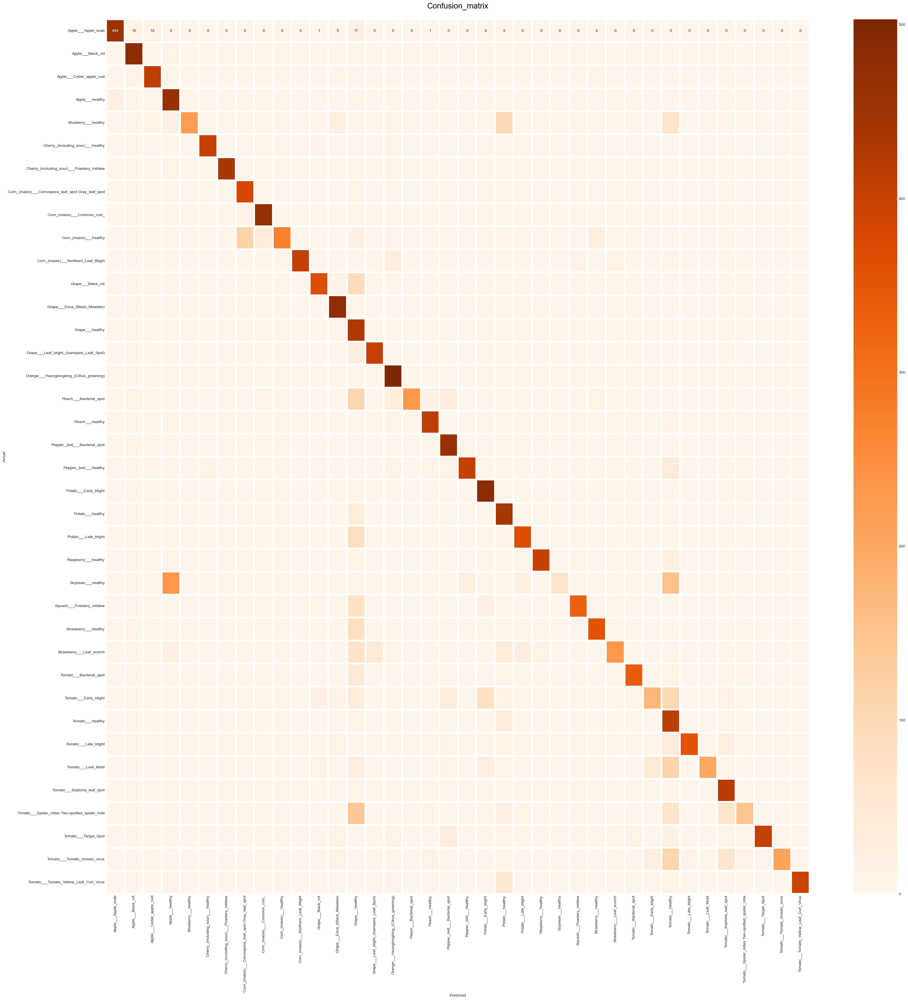

In [45]:
plt.figure(figsize=(40,40))
cm= confusion_matrix(test_data_generator.classes,final_predict)
sns.heatmap(cm,  annot=True ,fmt="d",cmap="Oranges",xticklabels=class_names,
            yticklabels=class_names,linewidth=4)
plt.title("Confusion_matrix\n",fontsize=20,color="black")
plt.ylabel('Actual')
plt.xlabel('Predicted')

plt.show()

# Classification Report

In [46]:
print(classification_report(test_data_generator.classes, final_predict,target_names=class_list))

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.95      0.90      0.93       504
                                 Apple___Black_rot       0.90      0.96      0.93       497
                          Apple___Cedar_apple_rust       0.93      0.93      0.93       440
                                   Apple___healthy       0.61      0.93      0.73       502
                               Blueberry___healthy       0.99      0.49      0.65       454
          Cherry_(including_sour)___Powdery_mildew       0.95      0.95      0.95       421
                 Cherry_(including_sour)___healthy       0.99      0.96      0.98       456
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.75      0.93      0.83       410
                       Corn_(maize)___Common_rust_       0.90      0.98      0.94       477
               Corn_(maize)___Northern_Leaf_Blight       0.99      0.57      0.

# Model Prediction

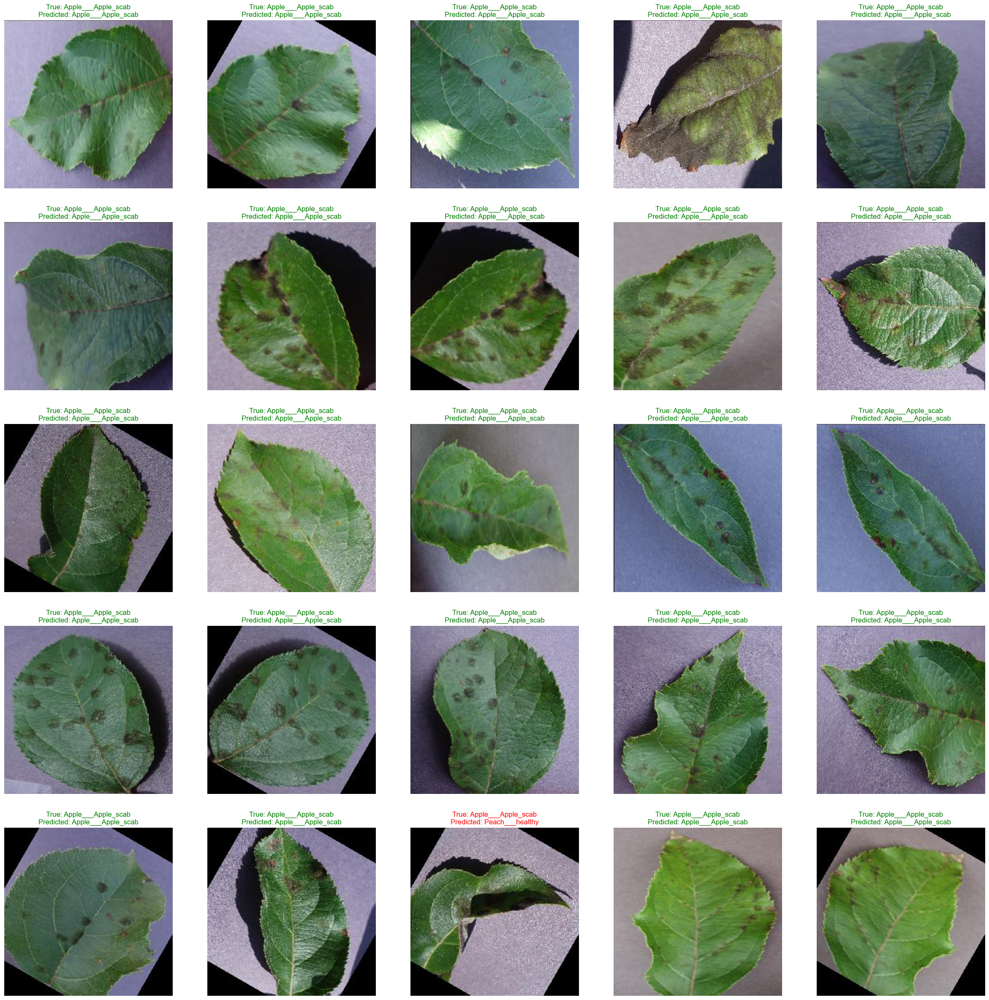

In [47]:
class_name = list(test_data_generator.class_indices.keys())

plt.figure(figsize=(30,30))
number_images=(5,5)
for i in range(1,(number_images[0]*number_images[1])+1):
    plt.subplot(number_images[0],number_images[1],i)
    plt.axis("off")
    
    true_label = class_name[test_data_generator.classes[i]]
    predicted_label = class_name[final_predict[i]]
    
    color="green"
    if true_label != predicted_label:
        color="red"
    
    plt.title(f"True: {true_label}\nPredicted: {predicted_label}", color=color)
    plt.imshow(plt.imread(test_data_generator.filepaths[i]))
plt.show()

# Predict Custom Data

1/1 [==============================] - 0s 97ms/step
Predicted class: Pepper,_bell___Bacterial_spot
Probability: 0.9093636870384216


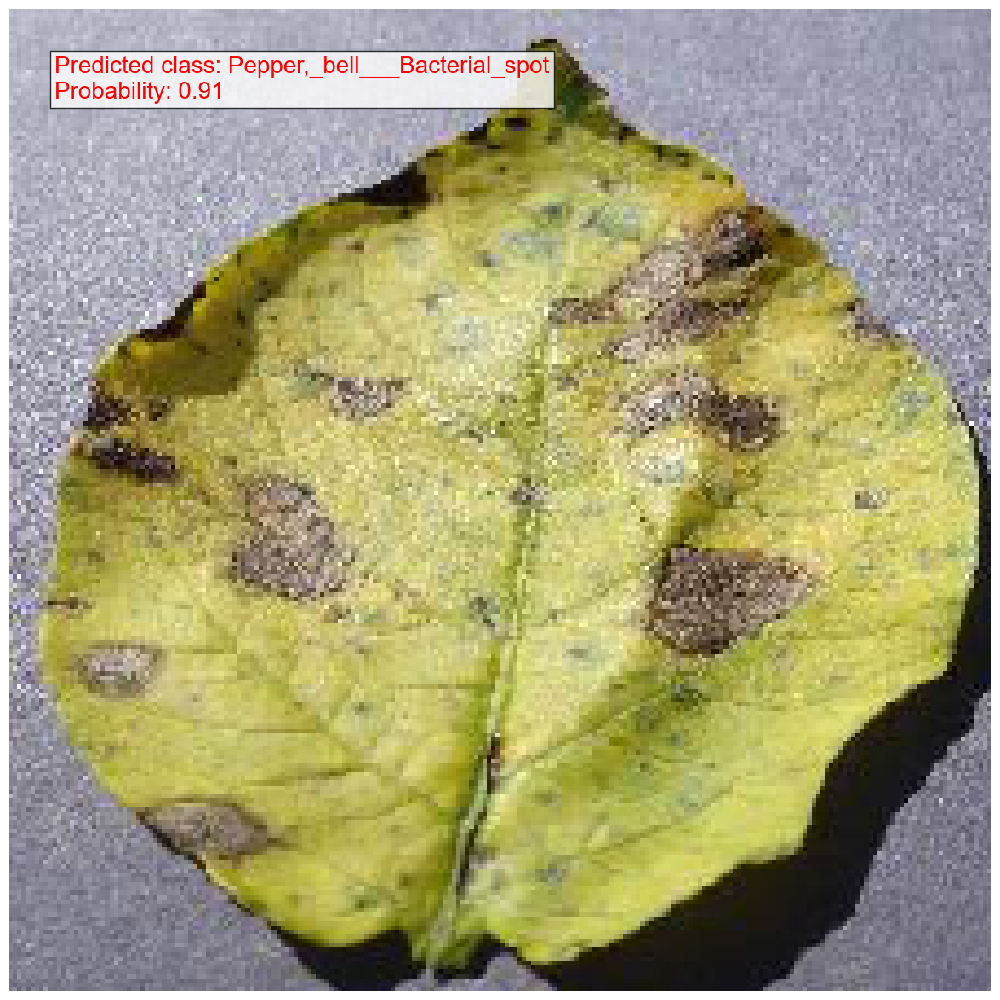

In [52]:

from tensorflow.keras.preprocessing import image
# Set the figure size for the plot
plt.figure(figsize=(15, 15))

# Load the trained model
# model = load_model('/kaggle/working/my_model.h5')

# Load and preprocess the image
img_path = "E:\\anaconda\\anaconda 3\\envs\\PlantLeafDiseaseDetection\\test\\test\\PotatoEarlyBlight4.JPG"
img = image.load_img(img_path, target_size=(224, 224))
img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)

# Predict the class probabilities
probs = model.predict(img)[0]

# Get the predicted class index and name
pred_class_prob = np.argmax(probs)
pred_class_name = class_names[pred_class_prob]

# Print the predicted class name and probability
print(f'Predicted class: {pred_class_name}')
print(f'Probability: {probs[pred_class_prob]}')

# Display the image with the predicted class and probability
plt.imshow(img[0]/255.)
plt.axis('off')
plt.text(10, 20, f'Predicted class: {pred_class_name}\nProbability: {probs[pred_class_prob]:.2f}', fontsize=20, color='red', bbox=dict(facecolor='white', alpha=0.8))
plt.show()


# Read Images From Online

1/1 [==============================] - 0s 144ms/step
Predicted class: Potato___Early_blight
Probability: 0.9952130317687988


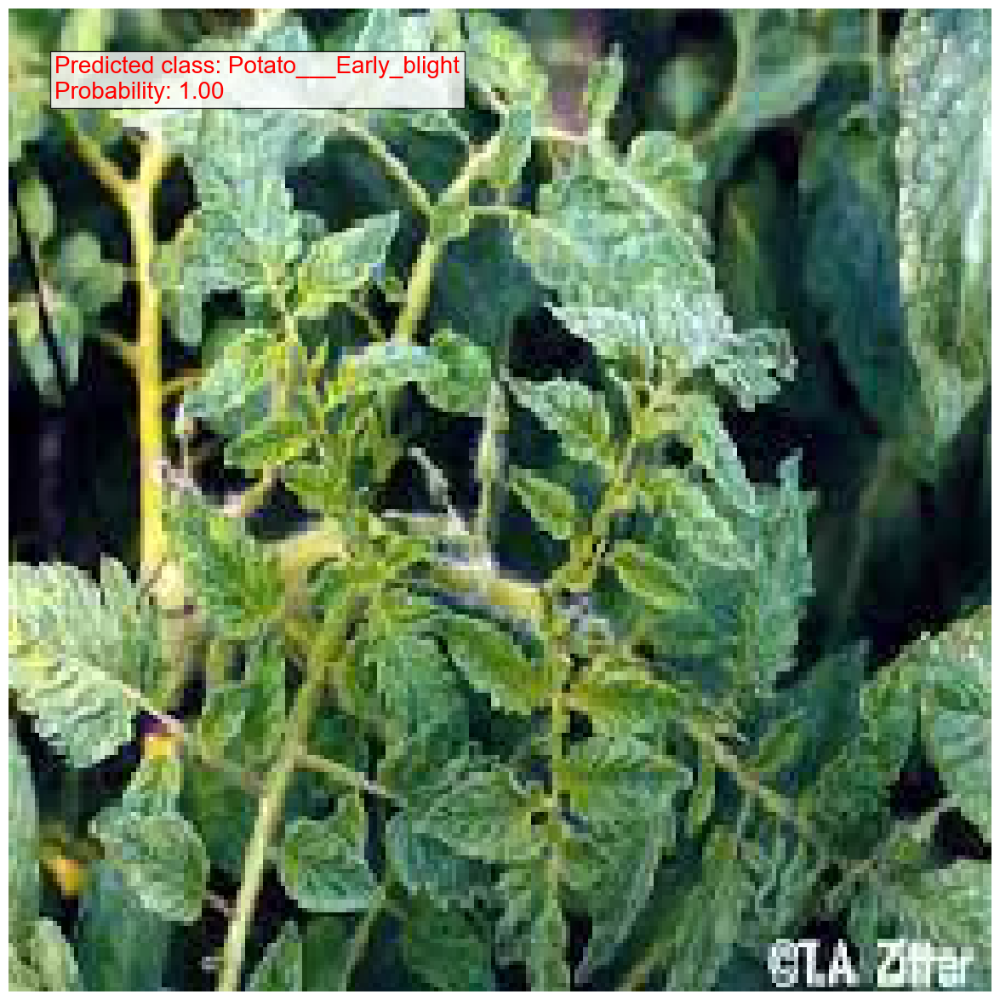

In [53]:

# Set the figure size for the plot
plt.figure(figsize=(15, 15))

# Load the trained model
# model = load_model('/kaggle/working/my_model.h5')

# Define the image URL
img_url = "data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAoGCBUVExcTFRUYGBcZGhwcGhoZGxwgJBwhHx0cHyMgISAcHysjHx0oIBshJDUkKSwuMjIyGiE3PDcxOysxMi4BCwsLDw4PHRERHS4oISgxMTMxLjExMTExMTExMTExMTExMS4xMTExMTExMTExMTExMTExMTExMTExMTExMTExMf/AABEIALkBEAMBIgACEQEDEQH/xAAcAAACAwEBAQEAAAAAAAAAAAAFBgMEBwIBAAj/xAA/EAACAQIEAwYCCAMIAwEBAAABAhEDIQAEEjEFQVEGEyJhcYEykQcUI0JSobHRYsHwFTM0coKy4fFDc8KSNf/EABkBAAMBAQEAAAAAAAAAAAAAAAECAwQABf/EACwRAAICAgIBAwQBAwUAAAAAAAECABEDIRIxQSJRYQQTMnGRocHwFDNCgbH/2gAMAwEAAhEDEQA/AOuN9nTdlsPLAThmSL1hRk6SfFjQ8xSqMFKuqNzm4wsZ9e6q/aFSZkMki4x5iORuQbGAY78Dyq06cKI02GEn6ROKKrd2TDkz7YLZvtZ3OXQmnrqMJE7AcicIHH3bM1mrusauQ5RhsKnnyPUDGtQnwPjsWJt54qcXRKpNRIJ5jAXJcKrVG0U0ZiN4/fbDx2c7G1lio4U/wEmB5kjf0xoegbuctxTy3CqlYzSSOTapCn3iJwVp9iySpKESblSLftJxpa5OmtPUV8VNtJHlPIdPMYIZKpTI1qwYAWM3HkR++BZOxCGI1Fvstw+lkaTl7vUA8DwAY6eeJuPZUVx9tJTZUU29+W3MYJ8Wpd4NOkat1PL2HUb+2B+aouF8Qvpg2sDFm98URB3UR3Y+Zl3bTsucvXIpy1Nj4PKbgT+WPuE9mpPjXURczt+W5xoFCnSei1Sp4m7whQTcRuT5Wxep5dIBmFkEnoBhmLXXiT5MRK3CuGLQpLTA01XClyYEcwoHIDn1IwWXhFDMN9smsKJWSQOQ5ESLD5YGrWFWuNIPhJN/Pa/KcX3zYpuArang623A/hAkQBhVYMNTgKM+q5elk5FKmqa2UBV3Y9N7wt8D+1OWLrSqhA2moA6ECSpUht+hgx5YMZeutQ+LuyeQYEMvuD+mFTtP2jRMx3bLoCrdZv0mCf8AnAdTyDXKXqX37P0aqxpS8AQNvcXm2FbifY7ujrpszxfSRNvUb4c8jWpd19YDAU+dQGNJ2v0wWpsDRPiBJFnEXG1uU4gcjo2uvacFmV0siz20zivX4O4N1IGG3jmVOXHeo3xNGkj8x8sCP7SqkxAM2iOuLq5amEtjUXcTuL5RgyqqksTAAEknyAwLrKyMVYEEWINiPbGv5TKr3wcIpKD4jO5HLoQZ5Yzrtx3f1uqEGxEx+LSJ/PFkzB9QMwZtQMMyQpjFM0qhvJODnZ7hgqv4thy64cM/wWmEGlQBGCzhehAHAmc8NqVKbhgSIxqeXrA5daqCSwjCJn8qQYEG8CMP2UyhTL06WxAv79MSc8iIG3uA6OUOrWznWDNsSNTqhzWXSWidsEctwXmXMYKFqdMGBNrkxAwGBklO4rUiahZqhMzifhOXTv0MEkTc4G8S7QsahCABQY2388T8C4zU79FtpYwZAweJVaqH/lcGZXgTZjPupJ7tSWeCdhy9zjR/7NpsCrguoChNPhUQbeo5XOKvBGQZhhpBL7QQLgE894I2xe4lmmePhVXj4ZNz1npvjhZNe0oxsXAg4czeOBoV9MWuRuLHlIvgnQyg7sypg7HqRGw998F6dGmiAFgOUESYjcjFenRZtjCn8+kfLFi2tyJUeJ3WreFWgyQPTzwk8X4wVrsjRUSZ0ndfQ4H9qe0zZoImXNRAs7GNQIHLywpPnnBIJMzed8ZMeAEEnuV9XiaNnqi1EV1+GAojlHI4tcKoZaPtjUVQQfBp256pEx6Xwldle0PdNoqXptvP88HO1vD6z0jUyza6REsi7j9xiJUqwVtfPvH4E7G5o/Ba2Qd9FKogJgqkaT/pkCfzwczFRUbTed7kW9hc4yz6GMrUrM5qLNKlBRmF1a9hg79IfbQUHCUoaoLeg9ccGVX4Ab/mOcfpsQ5x7PeBU0nU7i+krZee8m8fPHFXJIQNLNTcqYK2gjf8j+eAfC+MHNCnWVrCxB3DfeTa8bz6YPZLMUywpsSCBBBNxO+++24xejdzMx8GWBnWWDNNrCQqSxt5f9Yl/tAlSXpqF6HePO8DFMOqwBJJBW28Wi8YX+1XE1ogJU8OoW3vETf3GLruLZhWkmVqEkI3n3ZkE7fe3OKIylAZi9abWpVGOgGeoty2OFTN9slCslIQSpXWZBAO+kcvXCxQzWswztv1wpxkxgfcTVuLZoUrlYLC7KBB5WItYYAVOLFSG75481V56zPiwL4PxmpSU03Pe0jvTe9vI9cdcT4OtRPrGTc1KQu9I3en77sv5jCKvE11/ecVvYjLluMUyQwqUmUXJDqpnoEJke8YX+3uVFd2roFdYUErdlgbuB+othbqgG5X98Gew+Qq1Myq0p0/+Sfh0HfV5Rywx0LJirs0IL7O9os1lnCUwKi3XuyJ1/wnr8sadTqqpK06YCiPCxLBTF1XooJ2H/XeQymTyZc0EVqs/GxnTbZeajlgZWztOhRbM1LhDKj8TfdHufYb4gciswAEq4IFXD3GOEVKsrpkAWuLeg9cLByD0qg1KwINvCd+W/nha7LcfqPUK1HYmox2J8JYyCPTDtSztdFcu7IAIUs0qTO41eWGUlbWtS6OFXcl4zVqZHJ96UBqMQFJv4jza4xj2eUu2q7OzTtdifIc8bjmqVPN0AKgUgQeomx/0+uBfZrs4mTFSqaeqqx8DGDoUclOwnrvjsbBAakbEz7h+UzFKH7mqBz8DftgtxTjE01VQSxGHEZoC9RrmfCtyfKxsPPFKvk6dVCaaaanIkR7bRjjksipOwfyijwDhOlxmK3wgyFJ5+mGHN8YpAF2qADphZz1YqzKzSFJm9pHTCpns21U6dlxVFN8jD+WvEds12yoAwpZsAuJcZrVzpU6UPJennhWzOXKG+2DnZijKFztMewxQgKLEpxULcs5bLi0wo/E2DXC81ldQVEYMPvsALxuL88VlIa20cuuCOX4epGoxFvPCOzCjIAz3h2aqNmUAUsSYiBPqOWHqougkgAaAAwaAQfLSY254U+zufVMyyssgoVXlFxceeGYlXrMGEAQscySJvzi+OBJMYfjPsuW1irUCsrA6ZvvuSCN+hwQyX2lXSABAt5W/Xpgbm6umEVFB0jSFMyQPywT7M0wuoneAST1MYa7g8zL+wXD111Kb/3lNvmDcYr/AEl8JSm9OtTAHeAhgBzF5x2nElGfpmk8d4vduRtI+Hf5Y77R1aubrLT0FEp7Tv5k4zryGTkfMsdbiWtInDB2V7Q1Mmwk6qfNenphqyXZGiaUGS0fFO2ETjPDmpVXpsCQpsYMH3xVuGUFWhVyDqfoXh+aptkjmKQADUywgReDv5zj86Z/Ol6jO92JMk42f6Icx3nCmRjZDUUz0kn9MKHZ/sPorjMVWV6YZmFODfeJnljFgZcTsD2NfuWc3Vz36MqdRadQuumk5DA3JJjTZAZKn8XkMOveI+iFDVFNjBBIG4GoyRvacU2zCuV1Ko0kLYHwgbCQBzO2OqlAIZYMD11Hl943tz28sXVi3qOpjyH1ahzLOC6E/cBsPOw/TAbtfkBmcrUU0y1QHXSKmPG3hA/y3vNhAwT4TmZUqYJC2dYkjzgb+mJqVVV1kMEVVEu3K3K92w33ADd7i0RMRzvCa1ME1KTKsxPIH1BwN2Nsatwvhj1CxdyKTFtJK3qIb6vIbCTuTgnluzORoEP3Kuxv9pLHf8JOkGTsByxQ5xdeY4PkzKOGvUayozj+EEx8hg7lhWyjLX0tT1kxqtOmJEb8+Yw+vmS5hBpE2UQoAteBEDcnGa9sOL97WIRppUxpQ8m5s3udvIDDXz0YoO9Q/VyNHNkZiiQl/tqY68yo5E9NueGTguY7ui1DLU+7DTqc3M7Ak87wMBOyfBjSyBzFQhe9IeLyEAOkDzJM+kYF5rtRUCslJBTBBUPJLQeY5A4yFXe1U2BKE8TcuZLhzU6pJzVBW1Q9ySYO0FbEYl7U8LzFVIp6KlNmhQrgxzgLaTbCcjE3Mm9ycPXZjNAqUJ8Qjuw1heSxn8VsWOMr6hVj4i8x1KXYnICnQYPS01tbAsykOsQIBItYfng//ZrOpZhYDwixgfoTzOClHOHwgkEEAw39W9sT1aiVFAXw+RFp8oOFU2bPmK49ov1cjUp1FqLTZ20kEEwOknT+lsFuG5utZRSIBiUe4PmD1jHOZNVCqLpk9Pnb9MS0gjU2apU1ODA0yIjks3Pr1wxQg6ihqk9bK0nVigKNBlTuBzidxhW4xl2TWUDOCsgrM/LBuvpB1osm2o6pI6898Rh9ZLpIqMLcgw5gjk364TgA1iMGB1Ml4g+usifdO+LGYyAp20j164540g+u1GQFRzVgRpbmL/1fBItrpBG3AlTijkgipQkVFjiKg2xPw/NulPQu2q1tsQ5kEEziThw8V9hjSBqKTqFMpYyxucG8tWamsSCJ2wGpkAyR6Ynoub6toth+IIqRuHOB5RKmco6tiSWAm4ANrXuYGGvOOiVGD0wDFjY6RyEi8+vPCZ2Xz/2yOFLEyoA3vYbecYae0VFRUpCwH3hJ5XNzF5xmf0mpVdrI8u2moKrWtYDl/wAnDBklii1QwNRt7D9yMJHEM741AhQeUzubn1OHjPVlXK0yCCCsfzwA2jOmLZbgGZqAtTpPK+JSQRcXm/phyyvDqlalSzNIT3q6qnVWFiPmNsE+xfHO/pPUqnxJYqB8gMBeCZw0KuZyssAHNWkOWl9x88R5O5NjYl2KhTPaXEawfQxKqLeZ/wCMS57jVGmrGoykhTCtBJ8oxR7a53RTpsxKksRI52v7YT6vCWrzUp1A7G8EwcHgDttSaAkzRvod4qa65ih3aIrfhBHxAxzwZ+tIKjUGdpHhLASB6XF8AfoOyFSmMyzoVMqPEI2BwGq8YFPidWnUYLT70EE8jb8sZAOWdlXrv/yaci+gGOfEs1SpIGYoEUgMzrt5+p98A37e5To5JIECnpIvclg0Ec9sR9uqyPlyodXZ2CrBmbzPtgPwfsYKoUEtJG4/qw88beSqKaYxXmOmTzmXUd+alOmbEBdRY+ZPhHsBj3tLmKZp96ZcOQaKBIAaAZJm0G8nlywKfs5Sp00pNmGYqpgKoYAzIBMyYnmB5YJ9lsiyF6LgvTHiWo9kDiCukHcdbcjOMeRkuwY6AmxCtCmxJfZTGkGBYXjTaBf8sQ1OI011qzqzLMohpFjuYA1Ezfy3wr1e1Gac9yADUkqw03LSRAjlHlhSzrPrqajFQMZI/ECZj3H5YbDgYdtOJBjT2i7YhXWmQ60ogoN1BG7GSWeTJGwA64o5PgtHM1aSo1KCw16HF0ufhkkNsOVicC6WXfOoaToxqKPDURCR6PAj3w1/Rz2bfKUaleqmmoTAU7gAkC3mTPpGLOSqaux4/ccKLuTfShxkIKeWp2A3A5Af1+uEui/uOmPYqZzNVWYBAphtViokgALcsT5YLZns6VK9zUWrIEqbGelrel5xTDxxqFJ33J5dmC2ToIB2xbUEAENEXsf54iD6ZVtxNjuI8sDOPZtkVFW0iW88aeXtJBSx1HHJdoIpsalKpUCCDUp3InbV788Hsq6sKenVpeDrEmNyCDEeXyxj/CuKVaNZa9OoUddiOfkRzU8wcaTwH6RaNXwZkvRcwAyXpzNjzKediPPCOntKHGYw18wVc6iTptY3NtwOmOckgYwC2g3BgefpfB2jxBigddLAybMrBhvYjw/n7Yqs9JtMrAUgeCwIYwZi0i9xzGJcR1cQieJlkZfs7lWg2E+k7g+XninmsnpYKEJY+IQb+UmIkRHzGJeH1AveU3BBLRPPb4xHUXnri/QqzGoaoJBIMGQYm14NjG2CqA6nVETt/wALqSmY0AALFRrSbjSbbmDvhbc+ExuBjVuLUadSm1GqAKezEyJi4hgJEGDbocIbdmHS1SopnbuwXnb0/PphykY9RK4gOfXHnDaigkHmMMmc7NK06KthYhlEq2wBGq0nCeLEg4op8ThsQ4XBETP8scrXIGmbXxS4Y4giZb9MS8yekYopkytGGuzmaNOvSYW01EM/6hh343xAOz1ElwRFhYXkn1jnjMstmvFEb4eK9T7FCBJheXKLx8oxn+oo0RHSwKgvOVjUdZIsdIFrC9rbjDJm80NIX7tMHbyOFHh1aa94AuY8h/1gq9UMxWY1SR5zzxnuqjV5ih2S40tCuAx8DkBvLocG/pDzSpUpVqc608LnkVN4/rrjOQcElzdUppJ1LEeK+NnHdrLFN3DHbjjIrmiqmQlPxf5jv8hhfy+YemQyMVI6YhLcscajg8RVRgKFTbPor4w+ZpNq+KmYI6yLHCh2o7O1audrMqhU1SXcgDbz3wb+gUQ2YvuEI/PEnFcnUzHGKdGqZozqZZgaQCTPWYj3x4iWn1bKhA15mhqKAmD+zHYt+9H2yMNM2DQAeYO3LbGj5HL06K92L2Bn0G5g8+nLCvx3j9HL1wtSoQGuvdqugAE2JmQbRiQ8eEipThiRZnJYL5AbX642FC22N3MWQm+qhl0AYOwC33eCY6C25PyHrj3O1T3VRoJWEAaTcmTt8/ngDVStUYs0+bNZfl09MX+IZ6m1EUhUEArsDuBFj74yZMaLTE7v+Icbd3B1bMigBmBT+1qxT1NMKRI28wJ84xL2S4QKYdqyIzGoWbVB5WPOAdRxFSU1NVGoWemRKt0O4udjHXEC8RzFQtolEGlBTUXJW12jUSABOOtqIU17n48AQkjRIjd9bqIAtOmqryX4Re9o5x1jFPiHGUoLqq1kprNxF552QMWwr5ltC98HL1EYDUTKwLPp9JifIjCd2jzjVKzqLwAfmJxpwcnNE/uIVs7mm5jN0aqLULCotRfCwVgSpsLm4vgXk27qoWpowSPCfCT7gDGf8M47Wy3gUq6Ag6XEgbbGZX2wVTtouolqTXP3XkL5gECTir4nLe8Q4/aNvGaH1pPChNVfEDIvFyP/AM/nhS4v2fqV210HSohOm8oVI+6dQifkMO/Y/iCV6FauutIhdbgCLTIhiOeEbM8SbLZyq9B0dXMspGpTN4ItcdRhsYKnj5jqvEQfl+x+cb/xaVkDWz01W5ixLeLrbFit2IzdMuxplwlwyQdYmJW8nzESMOXCe0WXzFOGKUKiyTqqaf8AUpMBhtY9MEMzn6isDKtpkSv+6NwR6bRh3zFO4ObRF7HcXZNVE13pJJJhdQB80PKd4vfDSKGZRi+tSrMGVgwCuATNrQZ5EDEXGqKVMvUrLpUrpqwAOfhYfNp9sV+zD/WKFTLPykjadLXMehE+oxmyurKXEKj1RgTMO+Yq/ZlDTpKuvVvBBBP3SpXYXsZx1X7W06bFaSFmAMktY33mJJHpi88rTFNaiU6aoF8YktAiSWMG0WjEVLurBRSMjxFQII6zHQbYRMlnkIzAAQbwjtClcxXqGnUn4TBSoCbfGpg8jHriemlNqeqnSAWdLKYsZ2PK4khhY+RGAv0hcFC0DmKKEsuktoNgnN4jba42wm0u1tdaDUPvTK1dRDLcGDyO0e53xtQEi5MJyFiPvaSqqEO1DRTGnVVptqIuPiQgEXgAy2M64xUR69R6YARmJULMesNcTvHnirm+N16p+1qM/rt8hAxD9YXfFlWowVgJx3ppuGHvg0pDLqVtxywFrAPiXJ1dFj8JwxnOvIa7hMIRN5w39l82Sppn7uxP4TuPY/rhUoOGgg2wf4eQjqwiOY8jviGQ2JMXcN8R4GpBZfCWBPuL36YpPlmp09bgLpIIM/P2ODRzQSlqd4hTqnaZwhdoOMNVcKCQmyjr5nzxIY7qMDcTkF8EszXXugoHvgcgxcrglRG2NomqVIvjunT64+Cc+mLJg3wpiEx++g6qRmKqzui29z++DP0i8MqfWqdaixLoy61QNKgmZNtjEW64AfQpH11x1pn9caVxWsO/LBzrRLqDebRq5FYx5LtjX6o2N0Ny9jgLmVfSVl6aZt3cs0gEJEBQRt88VOyuZohWqVKqIysBTpsTEWloAg3tc2g4ce1fDRnF+0MVVMCoBYg30wPM7+eBfBfozLl2qVkVd1ggm3OOnLGxWRlrlImn0IcoJ3ukGurl/hAYQfTcjzjEwSlSO3eNMRPwkD7xaR52k7Ac8BKr5Xh0mis1SIFQiSI9PhBwpUeO1Vq1KhhxUbUyuJBPUc1aOY/PGP8A0heyLrx4uDgF/c0J1q1Kyq6U1pEEHu3ut5DGd2BAsBeSMVcwe67xgTAB8pJEX6EEYh4bxGhVUaKsMwPgbkd4uLYsZumTTNOZmzANeTF2noLYzkMCFZai7gPI8RNV+57sBAkDn6zyvfAXtTm6aOKSySI1lSNukxvHPlglx/h1SlBp02F9AKFjJn7xB+IzYCBgDmuzWcWGfL1PFewmf/yTGPQw415cgdTlGty9mOzoq0BmMoWdfv0mvUQ8/hA1KPSfXCzUQzBGHLs1XzOUDr3NSHiCFMg8sUu13CagYZqxp1RqBC6SD95WXkwP642CwahE0TsgKacNSjMd4rsZgG+1tpAGM3zuSqNUd6aMy6yLCTPoLx7YNUKdSnkKEtd6rsYMwoEASNhbbFPh/HlFQrUEIWBFRd0YCNVtweY98QDMCxG9xWgRcq2qCrDyII/XD1wvidNUVaiOhAA1I02A87yY6nF+vXkAVAlVIDBoBsdiOgjngLx3JIF72k8AkeDeBe4JO1tsR+8uQhW1JEHuHVp0sxTfu5CwSyN8TabjyueQxVCGhT7pFAqVCGYxOhdwAeWKPZdD4qtRtNNf4oDH+YH64L8Q4nllBJcO7wGIGliCeXoBM+WIMvFyqix/S5VfxswNxOlm6tIhVZ3O3OB84X1x92NzeYpOaebXTTWQCw8WoQbfiWCQfXc4NUK471aay8rqUyIO4URtuI9sEqPdVyBUpeKLAmY8x0viivY4stCITU7aovgVIehVQ3WCIa8SeRDRFsZT214F9Vrwk908mnquRBAKk84kX6EY0F8gci7LH2bg7AAMJtI2DA4mzWWpZukyFlaPEuoXUz0O4IJBid8a8bUKiK3E/EyXg3DGr1lpKQCZJJmABubXPp54tdrOEplmpojs5ZCzEwB8RAAA9Jv1GHfJcFpUqorBQTSkyoMSBG3O5xS7YZGizd/UL28CqCBJF+nIk3xX7gjjL6h7RARMXctS1WjETUxJiYm3pgrwhAPG3LYYLNq453LK00pqoC4uJmRa0qOm+KlSoDc4C8VqkOGUkemIhSxuLx5dQxx/ibMNJawMwMCMlXmqp6XxWzNTVfHmReCTioWhUYLSzmtRVNIMkkA/PEgB0Fh8IME9Mfo7OcFpVQaNSnTamAukMoiBHlb2jHv9np417tQALNC+JR90j7wHntiA+pAHzH5T84Uqdp5YlGSqimKppt3Z2ePDuRc7CSOcY2HjnY3LZhWhBTqbq6eGVMXKr4SwnpjrszlHoZfuGUBqRelUB2a+oNHNWDKw3sThmzACwILFRb+hbLgZuTvob5Y0Tj9Kk1QEDx2Db3/DIHU4W+EZOnkatV6caqviWdqVMAEzz0BpPoAMO+Rp0xSmQ5eGLcyd58h0GPMz47yc7llpkqI3EeHPTvOxGxjboNwPI+2Jq/HEcadEMAxA8/vCeWwPvifilCWfQ02MkDUBuPFY3/bC1mqagyzjqGB39iZAnHMLAJ7Exm1NTnjvAFzLrVptBclWB+EkQAQR1IOOuDdgkY6qlVWAJBVQdx5k4npZnQEESRIB6g9D64u8LzTKCvwoCYPXrjh9Vk6EtjomjD2U4PksuoIRBpvqa8fyxX4ytOqBWpFamgnUUIsNJ3G7C+wk4XeMVAWD1H1Kvw0hPibqeuJ8tVrOvibTTF4tb0iOe2FYv+TGzGZ1vjUkNSpSpvopJUFQkENJEeQ5+kjcYqJlaQKFAyVR8S0yQo6AyDt7Yv0cyCxIqFmRdRiOYIjfyj3wOrtVZCFQKIIFOm3ia+xsb331YVOZNDX+e0UwrWr1dDWLlREB1Oo/hIMEf8jEr8RFRBQq5YBTeCIuDYzNm+fvhLyqLQJbu6yH8RUkTPoAb8/fDHwHtAwGlSjjyC/odojHoICo2CfkQKb8yv2wyFRaKOit3dMMpBj2PL+jjM1vfG61OMa6Wh48VmAgRGxtzwvnsDlagmnUZD53/T9sOufGnpYkGMUJ2IicD45VpQurXTX/AMbbEeRiQfy8sNOSrrm01BBSCsFN5JHUtAB32jpiNOyVGjVIq1Gfw6lCgqG3kSbyI2GLeQztB1amCyIPB3XdNeN9JG4II88QzkP/ALYs+4iqlHcp5yg70u4pKCuoBI+8qwWYtMASQvUnVaBOKFXgTMwYV0dgIVSCB0s1xMcsV+LcQqd8Gp/Zoo0qFtYNzHWfLDBw+tSrICwCVYAbcAkWmRYSL+uFvJjUV/37xWKkwZmqT0lVSpCg3YCRPXUOnTDLkuJLVC6wKZLDm3iJmRI+Enf2xWOUqpdPEOYNwfIm42xBUsCShQrPg3HqvWOnTDI/PvuQIqMSVdJK1EYobbyDNufznlgXXyEFFVfCSAC3L+R9sCKXFKimUYj3tfy2jEtHidS5LFlkagANzsR/xjQBx3BYM7y1OahRmY6CbHaN/Q+WB3axA1BdJ2qzHMLpYT84Hvg7TpgqYB1H32AB/rywF43UVaDqXRSQIUm8BpiRzth1EAOxEzMCLDFkvppX57YrN4jbEfFKs+EcsUmnueNmdhivmXnfECtjmq84eMF3PWfH1E4+prIxZoZU8wR0HXHQtQn6WzDtTeWaFaLnkQoB33B6WOKeWqMKjK1tUwvmNiJ8reeLVHL09YaNTciWn5EzI88QcQpkNcU6aC7M51T1CrG/njyVZgeJ/mcQDuRNKkBokREDe36HEWfZSKjAgN52uOR8wCRixWyqVqepSyDk5kX6gEzHy9MDeI8PqiSumodMSpg/JuceuKXEqCcymp1reEsKdSmxn4tTKVtH8L4vqgNGn9o6hVgqGjzuDzvhdzxYMikaPHJDSDYTEe354v5WtUNEs5ASNRMibnyEbWxM6AjYyeW5EucpUA4VLsSZN5Jtz39sdVqiFRqZUaBPeSd/KenLCrm+L06mcRN5ZRt54L9pUqOraELFhci3Pz3w7K1gHz5jZAG2ZZJpBSQwYTJvZQDdhFvQY8qZsNpDTTUg6f3P74G0MmEy9Og9TU5hmgzBJkjzAFvniDtW4pCk63JJDTsRAhT0NjiX2l5cV794ivTVCbcPeoyjvCAL6l/DzHrjrtFmyBopozNYBVBPlyFvM454TW7vL944YBvEobciLL/3iMsvd94pOp+cgx5Wi2JEsG9WwJQgdy9whu7pSzK3iI0qNzAJBgnUb/IYs1J+KmVCnkVU7i4Ekf1GA3CM99pSoaFgB9R+8SAx6WuAOeL1FyqaiZUgbRYz77A74r9oM1mZ2cynxOu1NWZlraR8TmyesIQSPmMVCKdTxvSEkDx02ZYEb2N/Ug4J5syCCQbERIAM9RsRgTw/OU6M0ahApsZUqW8FoKkETom46Y0AGqXUSwZZyVEA6qVWoD0qQwn1EGOe2LeW49UpECoq+KYK3AAN+hm4jHmY4c1mSIIGmDM+dsV3pkq1NxIYQREHff1B54kcxBpxYlFJ8QzxLNrWFKspHgIBAuwJsbC2159ccDMLUbQigUzOu0M/SIiDfnfFLg9MIxAWASOZOwJm/n+uK/GKjVayCie7NM6atRCdO2xQ+HULXthceQK5KnX9JUWRvuWuIZKjV1lKTpUUSC3wmN+W/villqJUAtZBck7n/jBgLTWlAKFx8bkRPksXn2jfFfM06dVO6d6dT8PgewJ6iP0wxz8hv+YpRblLvysNTkA/xGPkLYhPEKlx4z5deWKDcGqUg4TUUBPiVw4EnmN4/bEKCsAH1Wj8Qn3AxoxqtaIkXXct1E1GNJBi4a0eh5YuZBGWzC4YHcE36xY3AwJydTxTUlxzvgtlKaiU1C4tJ5AGNpMxh8l6UxFWFKTszWJA5dI/WcJHbivpq90IIEMTMmTO/T0wxZ3i9KiB3hYlh8K3PrJMe4wofUDWqM+nQhM7yfz5nFEB7MfGK2ZTyjkCTiHMUnIL6TA3MWwfNBKYUAC3MicSZzLPVpBKYm4m8COpxQMO4wfcUTU8sFeD8ArV0Z0EBRI1W1n8CDdmPlbqRhl4D2aWmyO+mozbCPCv8UH4vIx1wxUcuq1P7whlPMfCTflsJAtiTZwTSyrZAOor8H7FuvjrOAPwJdgYnxSIH57YbcnwOnS8SPqMgMSfEZHK3wja3nixQzw+MOGvcwdwZk7++CuXzC1FCmAd12HhOomI3E874k1t2ZP7gP7ih2T7TNl3GVqU3eq0qulhYn7sNYA9VIxoAIC6wqgiASwb4uknzt7YzX6TeB09DZpDBVgpWNwYE+UYD8F7V1aYXvV74rZGeo4KC1hvbrafPbDjEpFiOTyFia/nuIT8euowjwUwNC7bs1icU0z9Ri5cCmqgHSvigTuW6+QnAvL8fpdyhqVaYTmAwne5APiI5gRyGAvaLt/TC91laTExerVtedwnMxsTETthftk9CILaXe2HakU82mXqUu9RVBeRpcFgCCjfehTF7HriPj1KrVy+rJhaqRLKfDUXoSh3jpPpOBvYgVc1nGz1XSyUgqkwN9JCoq7GAJv188OXeIyVXp0gjidLdYEkbWxnyumN1XjZ971NSBONsdzNOzPBHFbv64ZVpnVp2JeZVTO3Mn0w25bK1Ks6m3MgNO37ReMfUeMq5AqrIj4xyIkC3ocd52s7rppkaecEyfLeI8sB3d331IOLFwDmXBrEIQFUwrRE+cYL8RyoqijS0HSGLknchR6feLDFIUqaFWeVO5ET/wBYYsmgCNXcaRpkAn7okj3vPvhSWu4qJuLna/MkgU1vaI8vL9MCuGcRNNe7dQRJsNwIj06c8Gq+QpVmZ6VdQ5sA149wf5YG5vgVdSSyyv4kuPyuPcDD4+IXiYX5A/ElpsrCVYB2U3uDcR+mCIdu7IYafDYWiABv8pwotTZ69NabBXYEmTYQDc9LDbDPWzyqopAd40CSdto2HKbwegxTjxIEmQCJ3QeVBYeHSCGMAbee+A/F1QgqoB5gz+kcse8RrayBOoKLwPM8v2xOvDigNZyFUDw05uTynpPriikdydEQPwfjlSk6sCagUEd2zHSQRHtE8sMFHtHSbSGpsDp8TCLN5Dp5k4APwhDUUK4UkXVRIEbmWaI98SUuHtSXXUUzyEfmTsfbByIj9yo+IxcE4o9TMAaFFLUdwSSIsPI+fniPi3Gky1co9KmweWJQw2/MRBJn8sVuznFDUfRpUCLkECwv0knymMePwOiXZ2uWZjAsILTB6mD6YyNjxq9MKFdSocgRg+ppURaitKsAQZkXGxjbpiqeEt4gs+x59De3O+2JqGapU7QFVYkIIkiIURuLCeXLHtbidFwVdQQbBN2J6yvw8ueETEoOjJO1yjVp92PjKRvB22g9d8c/VWcak0te7QJIj7wXHma4chpMqVNDEggPBiJtIN+l8Bz31CpTaWXUVGrk19uk40KgN8e4AK7hmlk937s6h90Tp9+Yt1tbfAriWdC1JRiGEG4hlI2G1+vzwbz70q50VWNOpvTqKYLXuCAYMdD1wJz2Qqau7qPrCXVokx06x5Em+2HRgdsY7LrUhqO9QKzKtraiFEDnf1x7WVQpKknebQI3tNzi3eNb+BARC9OlsCeK8Q1Nba+3yAxVHLHQ1IsJDm38UC4wa4S40MsXeIG06QbTtNwb9MCMrliYdyQDcQJJ9OnqcFqMqQFfSV3gEgne/XHOwIInVUu5KJLMxUwAAOQHKIxLlswve1QZJKqQRvJJ362H54D0WksSSYuWNoF7k/8AeBWW4vpzHeEwGP5DYnzsMTVLXUKg3HFOFEeKm5Rt43/O3yvi/Qo1VbdXJvCkroPUTtPMTilSrK67M5a4ANo5YJZUOY+FFEDSNz6nDAKRqADe5Y7R5QVMtVWx1q5HtcfnjHqNElgTONh4nmYUiLaY6RPl6YTP7PgkiiWS5kXIHWML98IKMugvqLHEdlk/nizlOAV6sOKfT4jE9Lb4u5bLBay1QFcIZFN+fr+vthz4DnKbUtSqytdWDANf3i0Hfzw/3R0ITyA1LLaMvQp0KepEFhCwXJN21Gwkm5HpjvM5o08vW0oWCJpEA/EVMn2m+I6OfqIwDxE7iTB69Ftv88dVc4LMGJU73O289PY4gyry2JIE+8TOEVgVIIJ5/wBeWJsxmnWCsAeV8EONZam5epThGX4kUQrjeQBs0GfPABKgY2H9eXnjglsSICajR2XRs1VFOEmNXi2sQPUHHXbriGkigp2F4Hz/ADwU+jygKdCrmGMA2UkdDH5sfyGAVek3eVK1VdV/CDdRzkwf6vhfTzs9CWJPDfcU6NdBPeSYa0enPB7gecqGn3gqsizpURJMEXg2CnF7QlQ/aLSYjqqkj0CiQPKcdtl7whDMACUtt0HT/L+eKOwYaG5IGoM4hxwLmmp1svTePgqL4XKMJF+dreUEYr0atOrqakXWLEOI9tQlSffFPteQM3zAREB6ixP5A/lhjq0UWnKAaROmB+fqZJJxXhoX3UZ21KeTyp3VAI3JkifY+I+QGLlCuLEkMQ1iQoK2Hwodjzv1xWr5w6tLUlKiCAtpB5874tUWpMLOFG8OAp9BNh7dN8AgiSB9p1Uzsj+8ZgRtEe0rynEGXBb7Nk7xNQK9VPlO6nYjngquVW5BUxyBBAtuSLk4sZVAsEAk2Mx1G/Qf8YgxI2O5RfmCOGZOl9YVzUpK1PXqRQJIIgWWYIPXHmTrioHLBNSuV0qZsLz+vyx3T4eiP9mAKlQkm5axMmTcAzyHTFTP90KmsU2SosSyGCxA6bYmVVzTk/BlCdal9cmv3lgciOWIxQSVlNrSII/f29MVqeaqGNDhgPxTMHkVG8dRiOs8EAMSfwyf1Nz74so49SBhL6mia3MGASqwJPkfO2+AuSzVSuzKVVaasraQI1NPhE9BEyBgjm66U0DVGiWAE89Ik3674VstxZ6asQPETqBHL26fzxWiQa7hAqWe1rfbJTX/AMayb/eaCfSABi9w3iLrly9Qa1DBVkSfO/liLLcMXSGqajVYyzautztzvzxNn8p3gCU2Ap0zpYHmbEmdv+sAMpXj7RxY2JNmOHUqw10asGJ0M0kdfMfngWOHBVao+mBYCbWxfy2UYU6rGUKC0covA9euOK9Vu5UVQCGNrXFrE+o54NMBV+YNGRVImCwAgSdhYbjlGOKjFYGuOkxG297x54r5xHUaQCyxN777RimNTsARqJsBggRStyLj+adgoBbS0ggEQYjpf2NsC8tl6tRgiqzNyAH9Ww58M4cNJ1AOTtIkATJJn5YKpnqVCi2inFQzLDbYwYN94thhkC+kdyytQqC+zNT6sCmYrIhnwIGLMp2gxZRfDclNiCQQTHIT13PtvjIKyOzkkFmYkmBMkkk2GGLsx2pfLTTql2pkRH3lvMCblTtHLHOh7EDY72I9ZriAkOQCZkg9BsML3CO0xy+aqI16bOYn7pJn5Yv1z3lUKJv0EwOvKBAwN7QdiXNIVKFTvGILMrgCecKRz5QfnjOETIOLQ42KNYlvimdo1HZqYVmW8jF/K5rSqkETYwRYjp6YQuASgC2BYyx52tpP64ZctX1bGyximPCuJeN3+4mfIWe44ZTLpWQaEGtdzAtPlvHngfnMgQbeI/wrp/cYGDNmm4KsQQOVoB3Hp5Yjz/atkUd4neX6xPmQBBPrjuHtEu5xSJQuyeJgpgHmeV9vLCZlcxWSqtFkJcsAFYQZJgX6Sd8Fe03aQVk7qkjIp+IsRqMXA8IgCwwU+ipa2ZzApuwanSHeBnAYqRsAfP8AljkUopJmhEFbjR9IWd+pcOSgpAd4WOsXP74VOxHFlqgZd/70EkE7MpIsP4h06DH30xcRFXN6AfDSERPMwen9Thc4ZwI1EFQtoUzptMkTfeyzzxyYlOP1eYW41HzMZAliCpjcEc+oI/Mc8V6WVYMyrKGOQBDDyMW9DgFw7iGbRfHmXtyMMRFt2BxJmeOZwkBK7mTsFpz8wmCoF1MpU33CPE+FNX06gQ6wA5MyPwnnPT9sQcP4pTBOXYEJsp3g+Y6eeK3F+JVKdMUmqM1VhLNOw6DA6hUaoCGExs3P/nB2fV4EbjqjGJ6SNqIfUUkAAbgRBHlNv+8VM2jsIKkSTy6xFhijRaANJM9RuMSZmpVY61Z1qGPF6RvFotghz5iULkb5FxCCppBa5UmARYyBva2GLuAIRBUcwIZm5dSJEDywovRctpkqzMA8cyfvb4ZKnEgKaUqSlosSTFo3J6nAdeQjwlwVwlR45AyZ2j9cUE4nTcnWNLdIkHzB5YmyKmjTkgl2I1HaOYjCd2krNSzDqp8J8YH4Q149sSXHbERlthUZKmZhgyqBpFmJuf2/njrJKWbWRYX9T+08sDlRtCM7BSVBK3sTe/TEmfzi0l7sHxm9vuz/ADi3viqrUSpD2jzYqVAgGpKYgTzb7xt529sVMtw9nvYAXJ5D/nH2TpFjME/zwdpUSsLaT4jHIY4vWhCTO+HJJn8MCfM/y5zj6orU/FSI17aCBDg/zvPti5wpQykzYSAMDs+ra1IeyAEWkTJM/n+WFVdwSds0DUXLEhoJarGwgfDP4QTf1xBxOogGtvGZkKLCbAeoAxNkiCzvTps7BfgSmSb8zpG09cLucatVk06NR4Yg6EZgvUGB8Q6YpV9QqtmT0KdZ6nftUCJaBHxfwgeX4jgjl81qY0u7AT4dQJlhHX16dMLDZys4NNEcFdTMFBJA+8SAJUdemGvhrr4WABCosdSAN/c45lruO5Kzv6oSBoIAAgQL/l0viPKZQFtNUt6Tf9JOLfDRXaqqDL1dMkwUYTe0Ejczguit4S6GASrWNo+96bz6YRgexFu5FwrI0qbTTpfaDdheAf8AMfCfTBZ8krlSyKZBtZjvF98UQskAWImLwG9GHLE2RYgkGmIEQ0kxN79flhLJO4CTK/FMq3eCqhhjq1IRAYlYjyM36HBPJVw2X0wNQ3HQj/rbFrivwN6YXeyPxVf/AGj/AG4gNysB9q8oord9TIK1ILAcngSPQ7+s4q8NkeIEnkRi9x3+7P8A7D+uKHCtvfGonQmY9yTNZmXI+WAnaCtLBel46TghW+I/10xL2i/w6emLooq4ydxa4W9IVQawZk8v5wQSPQjGpdgQlKjUzVNFSmVkGCC2md5JvvzxkX3v6642Hh//APCX/wBOIfUdD9zWIi8Nyf1io+arAlGewmA5nY3nSBE4YMo4qPJMQdN941QAB6YHcD/wdL1P+44tcI/vaXr/ACwuQ+rj4mZibqCs1TJrVAPxv/uOJstSFNWqt8KifU8hjuj/AHlX/wBj/wC44i4x/hW/9gxw1AO4vV8wXcu25/qMS5bNaT5ER/zikcdJjXxFVKND+V0vswJ6bH5Ym1Qbk23E7evlgDT391/UYPZ74v8ASMZ2FGpIiQ8RB0kqQ2mDbnBkj5YpZfjI7xVFNVQlQZJmJHyxa+4/p/I4WV3HqP1xYKOMfFsbmk5qp4RAEEsDI6eXTC1xjIr9aWozg0yuu5H3SAU9Jj2nDXX+Gn/X3RhR7c/+L/X/APOIpp4yd1OczxYX0CSfvct+Q6Y94ZkGf7SodKc2PPAXK8vXDf2g/wAKvt+mHyniKEYKLkVDNq7ihSEAnSCPzPpAOCrgBWOrxEiB16DyGFzsx/f/AOhv9pwwV/8A5H6thWUL1JtOMzXWlTCiC5nYzAI3I9cAVqVF+BiB05fLHec/xFT1/kMcNsPXFlAqJ5j32QzhqZRUpMgqqzawVLwe8QqzIviZTTDKG2Vp2mcfNxp1rZ1aeYhhkCW0PCnMAopdfERrC6VJknwm53xnJ/fHFbl/XIYaWBqaJ2Dyy5Fa1bN1qVKtUrJTOv7TVTGmrUHhm7h41G1r4H5vhK5PvULhqfe1O6IcMCigHSBJMw433OEPJbn2/UYn4Z8S/wCYfrhTCxsTbsuM3SGVRnFSmzo+ZqNVEKCQEp0/FMKYJI3wSTiNMU0MUmQUKxmSbLNt7hgL898Ypmtj/qw1cH/wi/5X/niY6i8o75DKZSpl6bLTQ02CNqUgQxZSy6jUkASRpjbADj2ZUV2NOmFVGKDQdwDvM7/ywq8D3f1/bF9dm9cMVFSZYz//2Q=="

# Download the image and save it to a file
filename, headers = urllib.request.urlretrieve(img_url)
img_path = os.path.join(os.getcwd(), filename)

# Load and preprocess the image
img = image.load_img(img_path, target_size=(224, 224))
img = image.img_to_array(img)
img = np.expand_dims(img, axis=0)

# Predict the class probabilities
probs = model.predict(img)[0]

# Get the predicted class index and name
pred_class_prob = np.argmax(probs)
pred_class_name = class_names[pred_class_prob]

# Print the predicted class name and probability
print(f'Predicted class: {pred_class_name}')
print(f'Probability: {probs[pred_class_prob]}')

# Display the image with the predicted class and probability
plt.imshow(img[0]/255.)
plt.axis('off')
plt.text(10, 20, f'Predicted class: {pred_class_name}\nProbability: {probs[pred_class_prob]:.2f}', fontsize=20, color='red', bbox=dict(facecolor='white', alpha=0.8))
plt.show()


